In [ ]:
import cv2
from google.colab.patches import cv2_imshow
from skimage import io
from PIL import Image
import numpy as np
import pandas as pd

In [ ]:

img = cv2.imread('hiei better quality.jpg',cv2.IMREAD_COLOR)
imgg = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
r,c = map(int,(imgg.shape))
print(r,c)
a = int(input())
b = int(input())
r1 = (a-1)//c
c1 = (a-1)%c
r2 = (b-1)//c
c2 = (b-1)%c
#distance measured using 4 neighbours
d = abs(r2-r1) + abs(c2-c1)
print(d)

550 736
1
1472
736


negative transformation


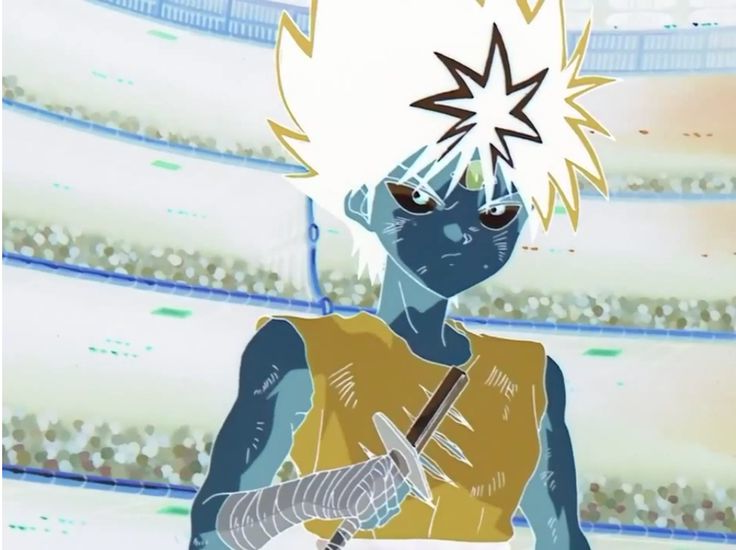

In [ ]:
#point operations
#1) image negative
imgneg = 255 - img
print('negative transformation')
cv2_imshow(imgneg)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log
  This is separate from the ipykernel package so we can avoid doing imports until


log transformation


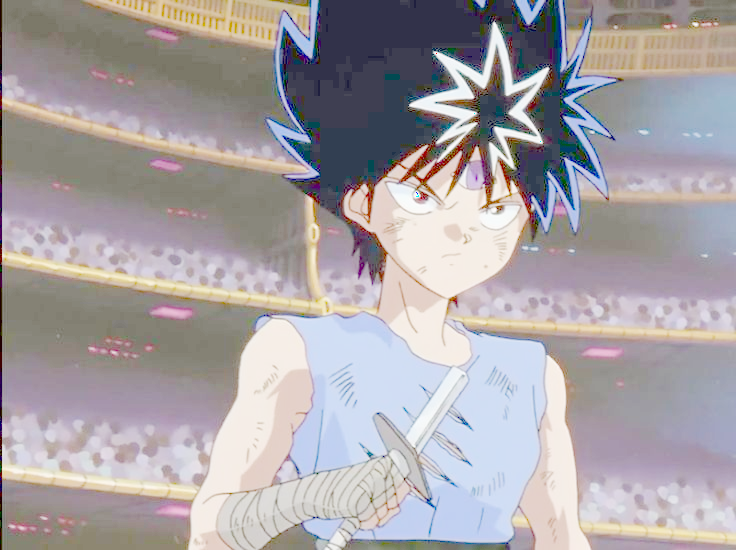

In [ ]:
#2) log transformation
c = 255/ np.log(1 + np.max(img))
imglog = c * np.log(1 + img)
print('log transformation')
cv2_imshow(imglog)

power law transformation


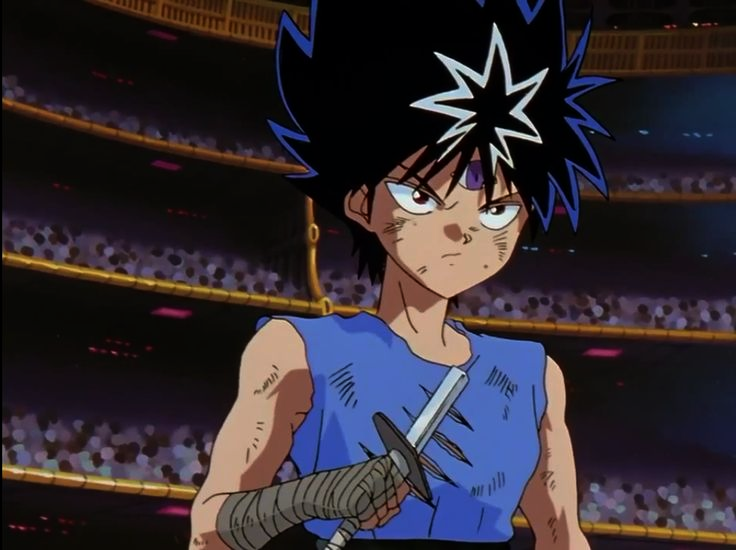

In [ ]:
#2) power law transformation
gamma = 1.2
imgpow = 255*(img / 255) ** gamma
print('power law transformation')
cv2_imshow(imgpow)

threshold transformation


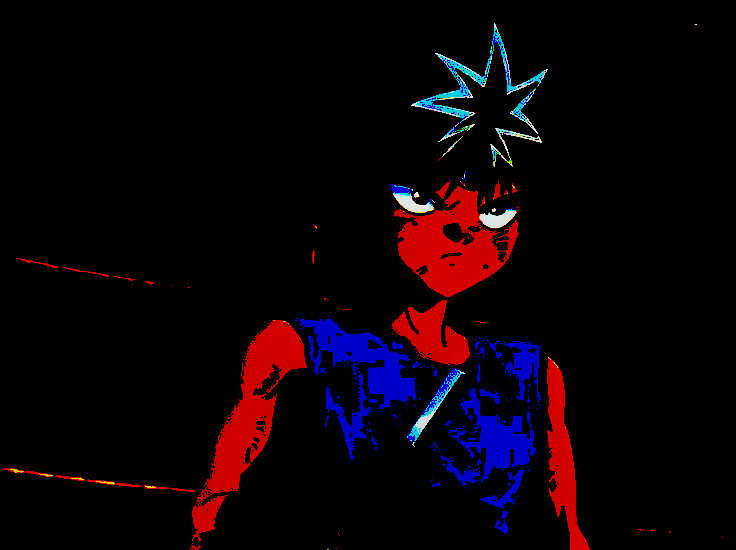

In [ ]:
#3) image thresholding
ret,imgthresh = cv2.threshold(img,200,255,cv2.THRESH_TOZERO)
print('threshold transformation')
cv2_imshow(imgthresh)

bit splicing


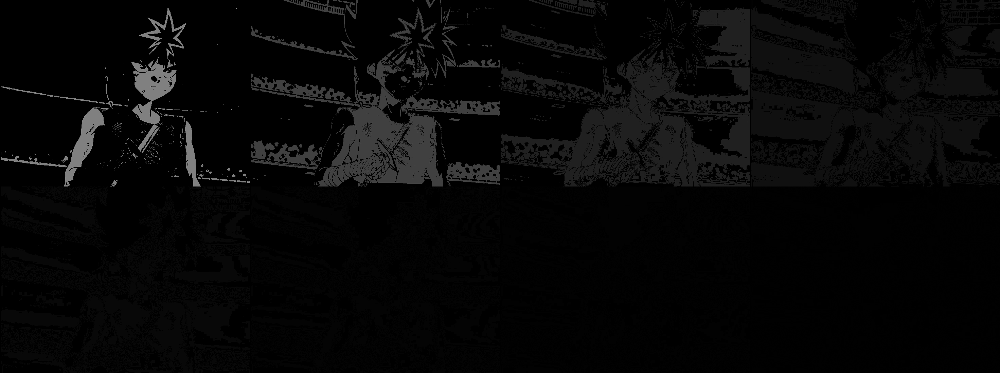

In [ ]:
#4) bitplane splicing
imggray = cv2.imread('hiei better quality.jpg', cv2.IMREAD_GRAYSCALE)
lst = []
for i in range(imggray.shape[0]):
    for j in range(imggray.shape[1]):
         lst.append(np.binary_repr(imggray[i][j] ,width=8)) # width = no. of bits

eight_bit_imggray = (np.array([int(i[0]) for i in lst],dtype = np.uint8) * 128).reshape(imggray.shape[0],imggray.shape[1])
seven_bit_imggray = (np.array([int(i[1]) for i in lst],dtype = np.uint8) * 64).reshape(imggray.shape[0],imggray.shape[1])
six_bit_imggray = (np.array([int(i[2]) for i in lst],dtype = np.uint8) * 32).reshape(imggray.shape[0],imggray.shape[1])
five_bit_imggray = (np.array([int(i[3]) for i in lst],dtype = np.uint8) * 16).reshape(imggray.shape[0],imggray.shape[1])
four_bit_imggray = (np.array([int(i[4]) for i in lst],dtype = np.uint8) * 8).reshape(imggray.shape[0],imggray.shape[1])
three_bit_imggray = (np.array([int(i[5]) for i in lst],dtype = np.uint8) * 4).reshape(imggray.shape[0],imggray.shape[1])
two_bit_imggray = (np.array([int(i[6]) for i in lst],dtype = np.uint8) * 2).reshape(imggray.shape[0],imggray.shape[1])
one_bit_imggray = (np.array([int(i[7]) for i in lst],dtype = np.uint8) * 1).reshape(imggray.shape[0],imggray.shape[1])

finalr = cv2.hconcat([eight_bit_imggray,seven_bit_imggray,six_bit_imggray,five_bit_imggray])
finalv =cv2.hconcat([four_bit_imggray,three_bit_imggray,two_bit_imggray,one_bit_imggray])

final = cv2.vconcat([finalr,finalv])
print('bit splicing')
cv2_imshow(final)

gray level slicing


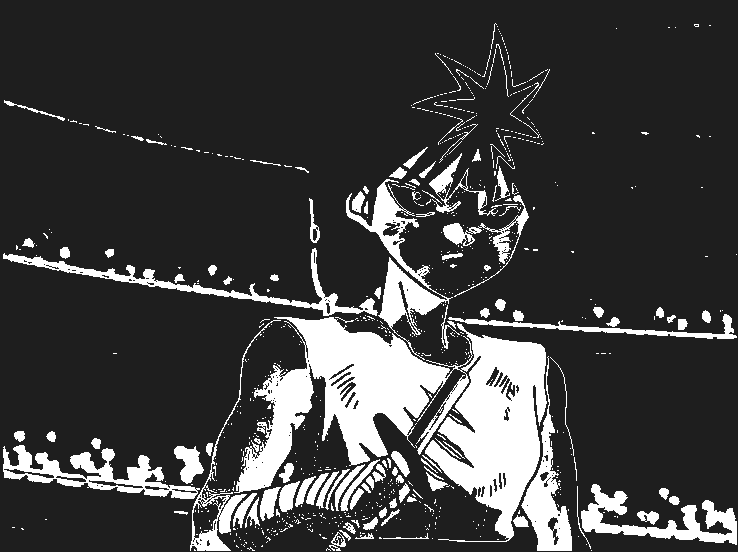

In [ ]:
#gray level slicing
row, column = imggray1.shape
imggls = np.zeros((row,column),dtype = 'uint8')
min_range = 100
max_range = 180
for i in range(row):
  for j in range(column):
    if imggray1[i,j]>min_range and imggray1[i,j]<max_range: imggls[i,j] = 255
    else: imggls[i,j] = 30
print('gray level slicing')
cv2_imshow(imggls)

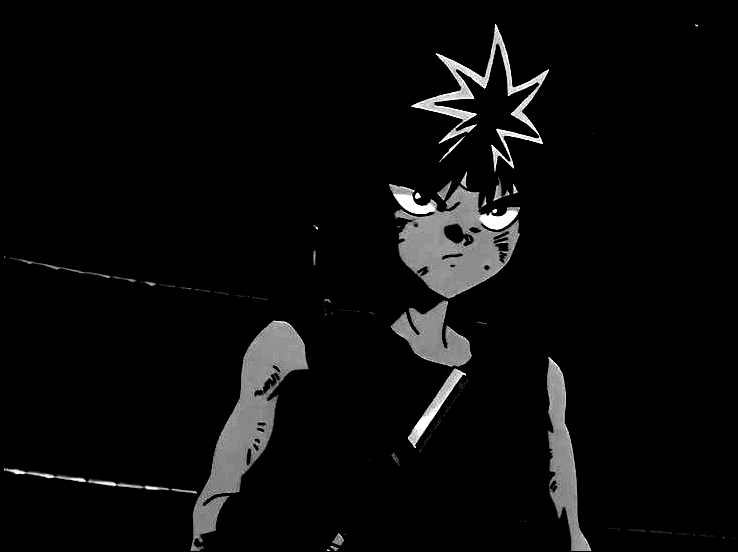

In [ ]:
#contrast streching
def pixelVal(pix, r1, s1, r2, s2):
    if (0 <= pix and pix <= r1):
        return (s1 / r1)*pix
    elif (r1 < pix and pix <= r2):
        return ((s2 - s1)/(r2 - r1)) * (pix - r1) + s1
    else:
        return ((255 - s2)/(255 - r2)) * (pix - r2) + s2
  
imgcs = imggray1
# Define parameters.
r1 = 150
s1 = 0
r2 = 210
s2 = 255
  
# Vectorize the function to apply it to each value in the Numpy array.
pixelVal_vec = np.vectorize(pixelVal)
  
# Apply contrast stretching.
imgcs = pixelVal_vec(imgcs, r1, s1, r2, s2)
cv2_imshow(imgcs)

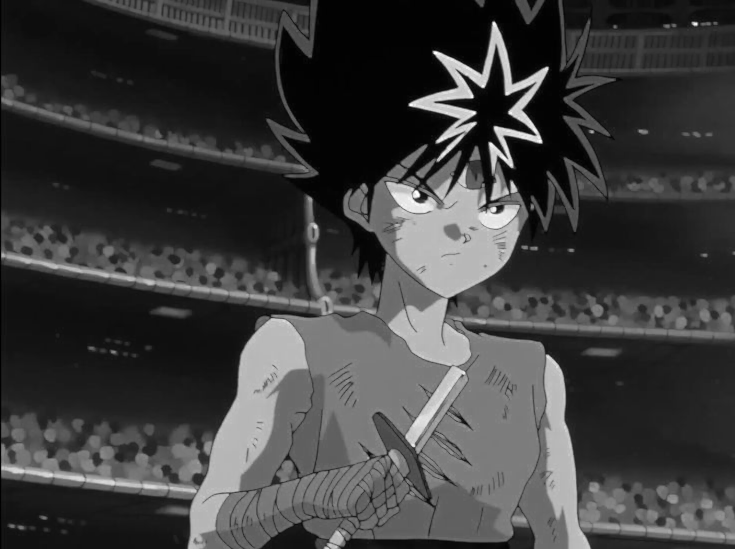

In [ ]:
#neighbourhood operations
#1) maximum neighbour
imggray1 = cv2.imread('hiei better quality.jpg',cv2.IMREAD_GRAYSCALE)
imggray2 = imggray1
imggray1 = cv2.copyMakeBorder(imggray1,1,1,1,1, cv2.BORDER_CONSTANT, None, value = 0)
n = 2
imgn1 = []
for i in range(1,imggray2.shape[0]):
  temp = []
  for j in range(1,imggray2.shape[1]):
    temp.append(np.max([imggray1[i][j],imggray1[i][j+1],imggray1[i+1][j],imggray1[i+1][j+1]]))
  imgn1.append(temp)
imgn1 = np.array(imgn1,dtype = np.uint8)
cv2_imshow(imgn1)

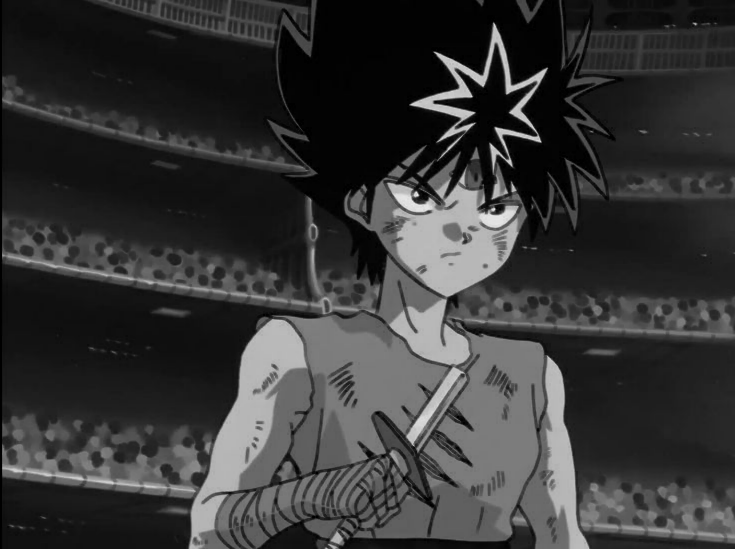

In [ ]:
#1) minimum neighbour
imggray1 = cv2.imread('hiei better quality.jpg',cv2.IMREAD_GRAYSCALE)
imggray2 = imggray1
imggray1 = cv2.copyMakeBorder(imggray1,1,1,1,1, cv2.BORDER_CONSTANT, None, value = 0)
n = 2
imgn2 = []
for i in range(1,imggray2.shape[0]):
  temp = []
  for j in range(1,imggray2.shape[1]):
    temp.append(np.min([imggray1[i][j],imggray1[i][j+1],imggray1[i+1][j],imggray1[i+1][j+1]]))
  imgn2.append(temp)
imgn2 = np.array(imgn2,dtype = np.uint8)
cv2_imshow(imgn2)

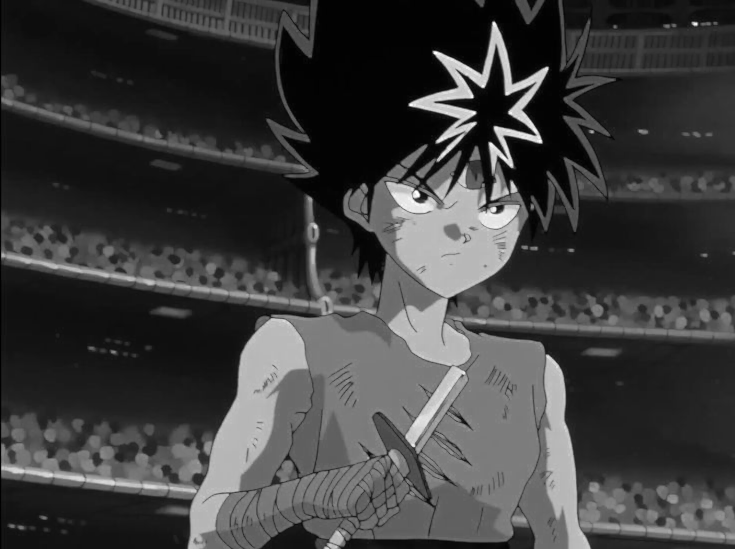

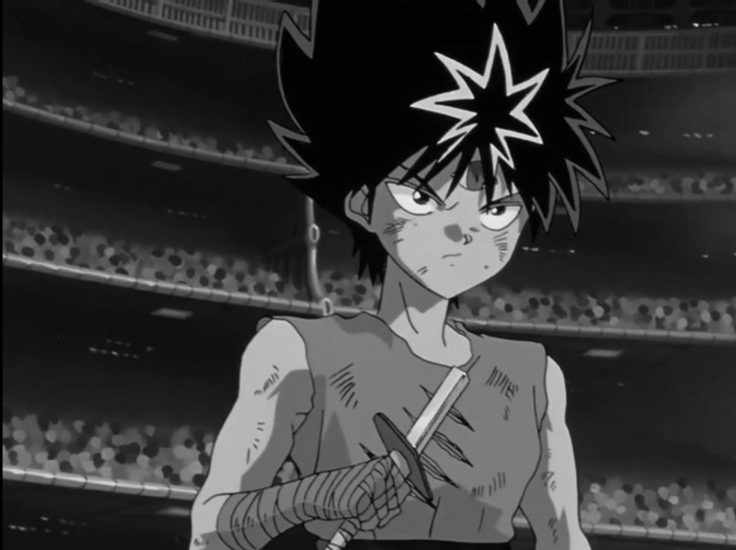

In [ ]:
#average of neighbour
#1) average neighbour
imggray1 = cv2.imread('hiei better quality.jpg',cv2.IMREAD_GRAYSCALE)
imggray2 = imggray1
imggray1 = cv2.copyMakeBorder(imggray1,1,1,1,1, cv2.BORDER_CONSTANT, None, value = 0)
n = 2
imgn3 = []
for i in range(1,imggray2.shape[0]):
  temp = []
  for j in range(1,imggray2.shape[1]):
    temp.append(np.sum([imggray1[i][j],imggray1[i][j+1],imggray1[i+1][j],imggray1[i+1][j+1]])//n**2)
  imgn3.append(temp)
imgn3 = np.array(imgn1,dtype = np.uint8)
cv2_imshow(imgn3)
#using image filtering with a kernel
k = np.ones((2,2),dtype = np.float32)/4
imgn4 = cv2.filter2D(imggray2,-1,k)
cv2_imshow(imgn4)

subtraction


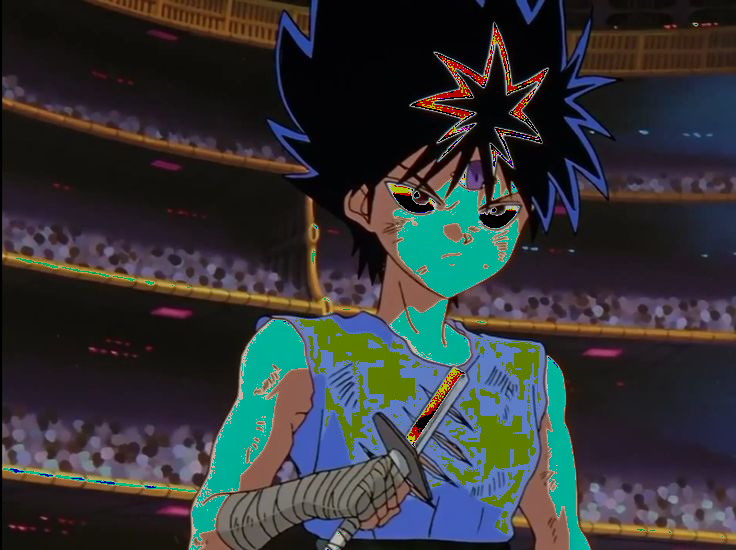

multiplication


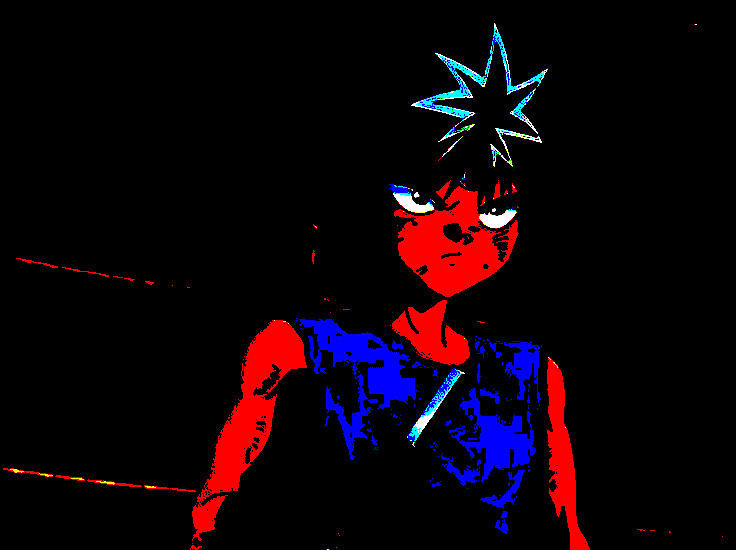

addition


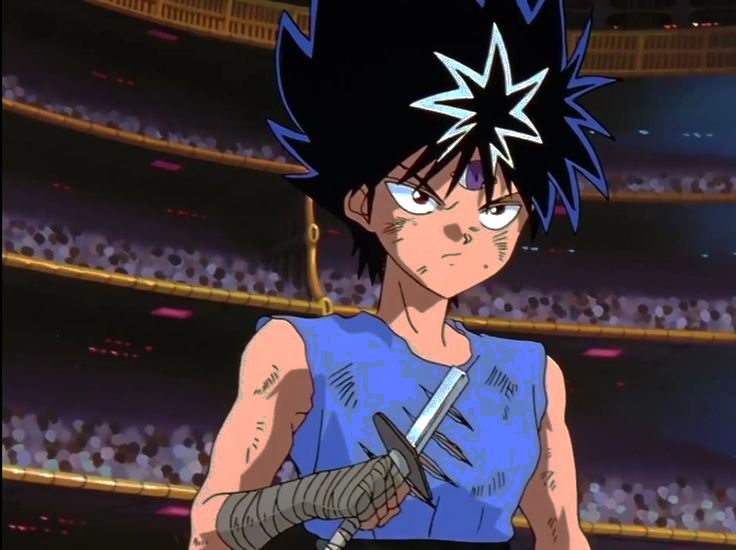

division


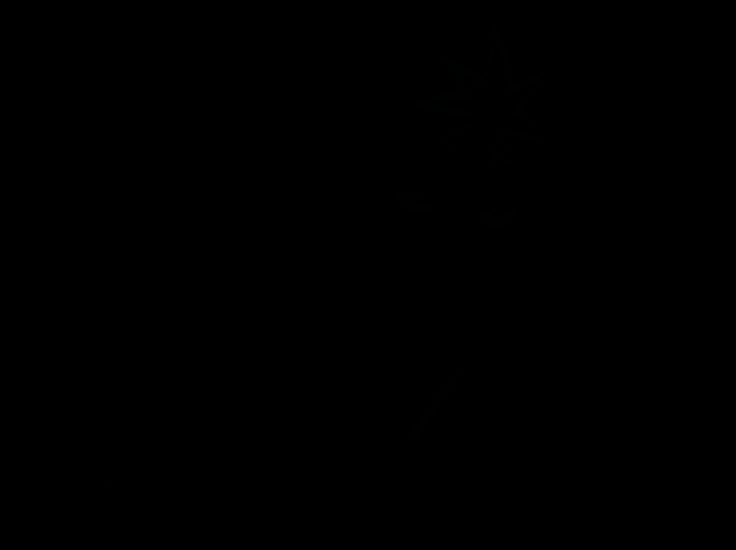

In [ ]:
#operation on set of images
#subtraction
img1 = img
img2 = imgthresh
#we took the similar  images that we worked on in previously
img3 = cv2.subtract(img1,img2)
print('subtraction')
cv2_imshow(img3)
#for multiplication
img4 = cv2.multiply(img1,img2)
print('multiplication')
cv2_imshow(img4)
#for addition
print('addition')
cv2_imshow(cv2.add(img1,img2))
#for division
print('division')
cv2_imshow(cv2.divide(img1,img2))

bitwise and


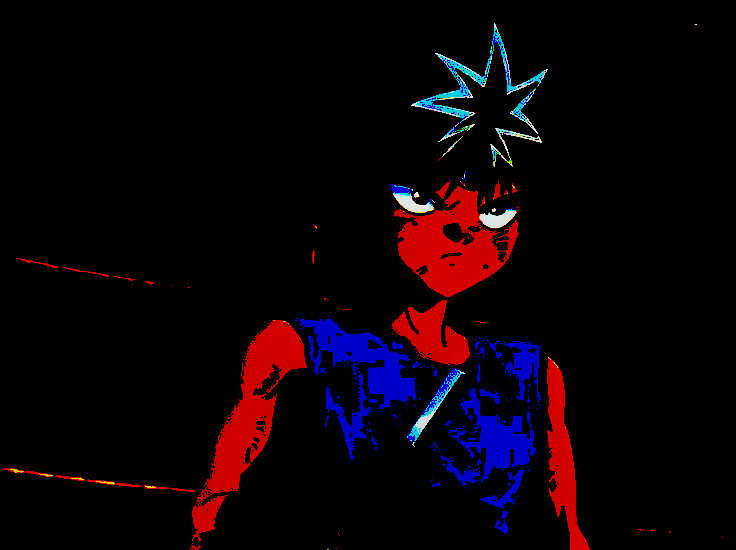

bitwise or


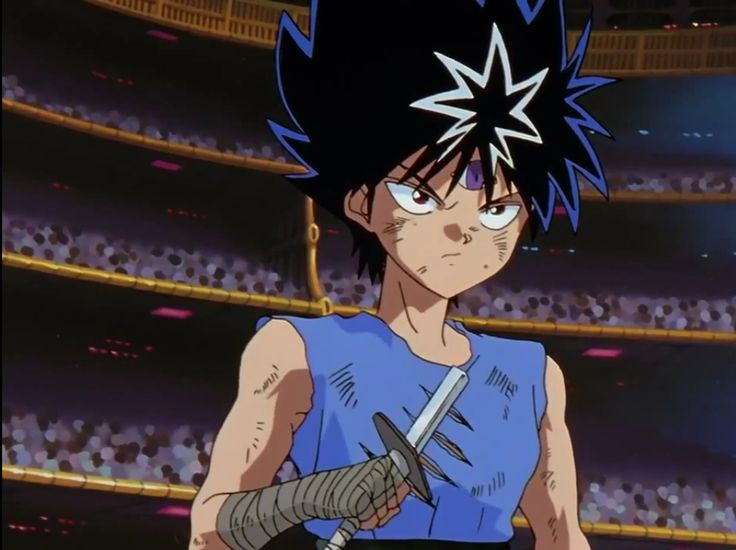

bitwise xor


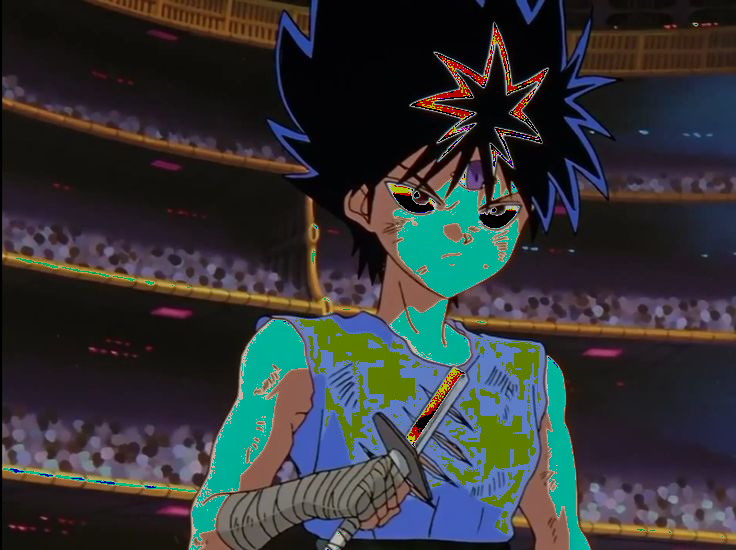

bitwise not


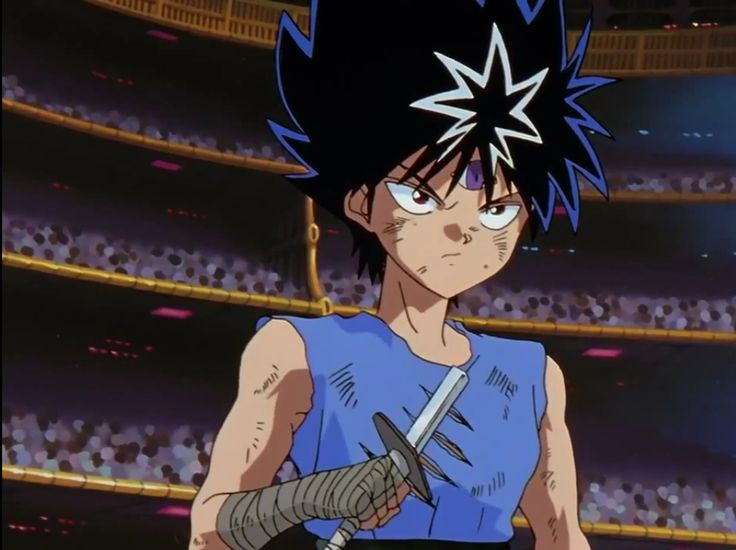

In [ ]:
#logical operations
img5 = cv2.bitwise_and(img1,img2)
print('bitwise and')
cv2_imshow(img5)
img6 = cv2.bitwise_or(img1,img2)
print('bitwise or')
cv2_imshow(img6)
print('bitwise xor')
cv2_imshow(cv2.bitwise_xor(img1,img2))
print('bitwise not')
imgnot = cv2.bitwise_not(img1)
cv2_imshow(cv2.bitwise_not(imgnot))

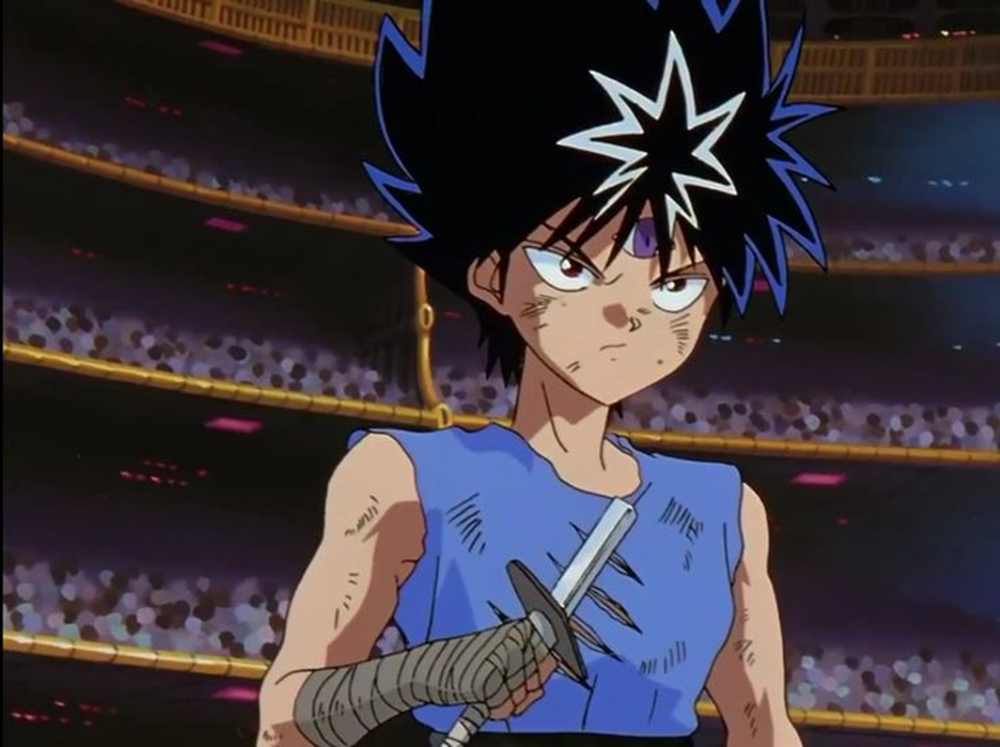

In [ ]:
#zoomimg
cv2_imshow(cv2.resize(img,None,fx=2,fy=2,interpolation = cv.INTER_CUBIC))

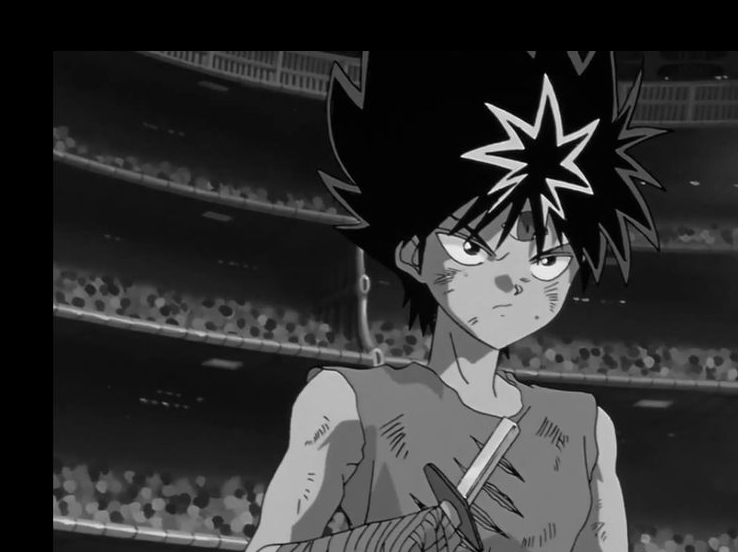

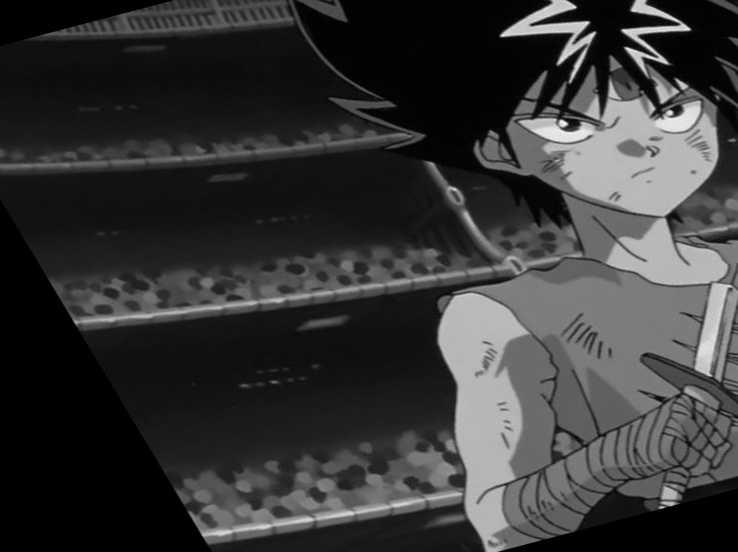

In [ ]:
#translation
rows,cols = imggray1.shape
M = np.float32([[1,0,50],[0,1,50]])
dst = cv2.warpAffine(imggray1,M,(cols,rows))
cv2_imshow(dst)
#affine translation
p1 = np.float32([[50, 50],
                  [200, 50], 
                  [50, 200]])
p2 = np.float32([[10, 100],
                  [200, 50], 
                  [100, 250]])
M = cv2.getAffineTransform(p1,p2)
cv2_imshow(cv2.warpAffine(imggray1,M,(cols,rows)))

median of img: 57
mean: 58.03818094340364 ,standard deviation: 52.329711664445796
variation of the imgage 2738.3987228840347


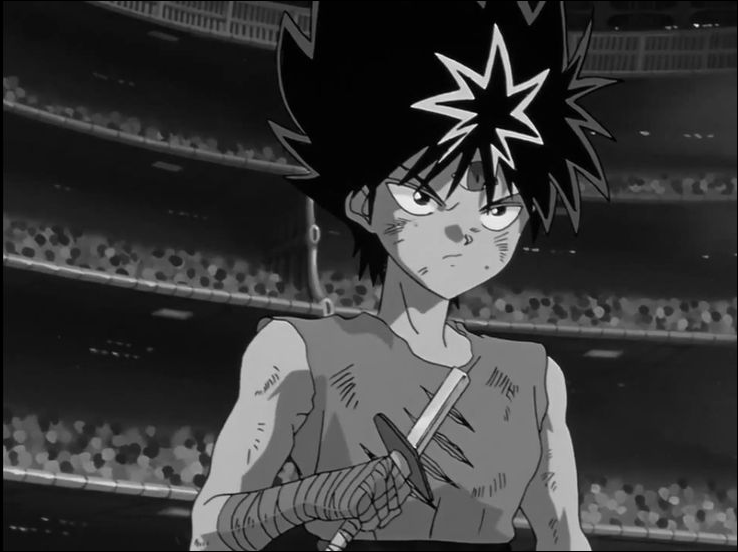

In [ ]:
#stats operations
med = imggray1[imggray1.shape[0]//2][imggray1.shape[1]//2]
print('median of img:', med)
mean,stddev = cv2.meanStdDev(imggray1)
print('mean:',*mean[0], ',standard deviation:', *stddev[0])
var = np.var(imggray1)
print('variation of the imgage',var)
cv2_imshow(imggray1)

original image


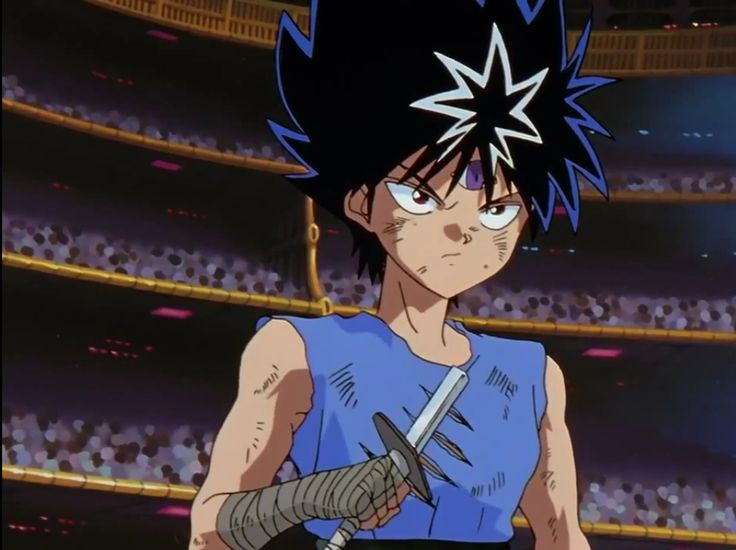

after upsampling


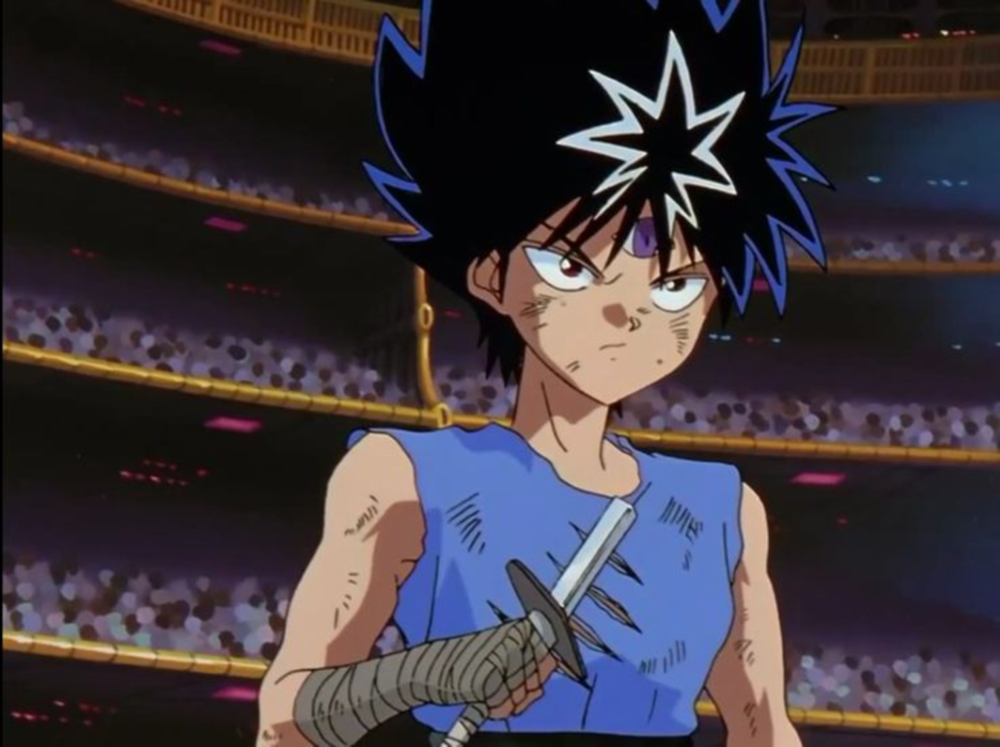

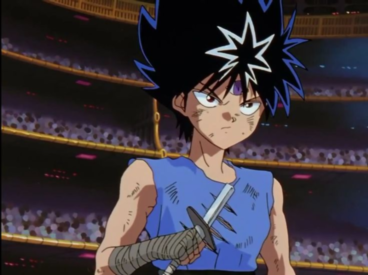

size of original image: (550, 736, 3) size of upsampled image: (1100, 1472, 3) size of downsampled image: (275, 368, 3)


In [ ]:
#image upsampling and downsampling
print('original image')
cv2_imshow(img)
cv2.waitKey(0)
print('after upsampling')
imgup = cv2.pyrUp(img)
cv2_imshow(imgup)
cv2.waitKey(0)
imgdown = cv2.pyrDown(img)
cv2_imshow(imgdown)
print('size of original image:',img.shape,'size of upsampled image:',imgup.shape,'size of downsampled image:',imgdown.shape)

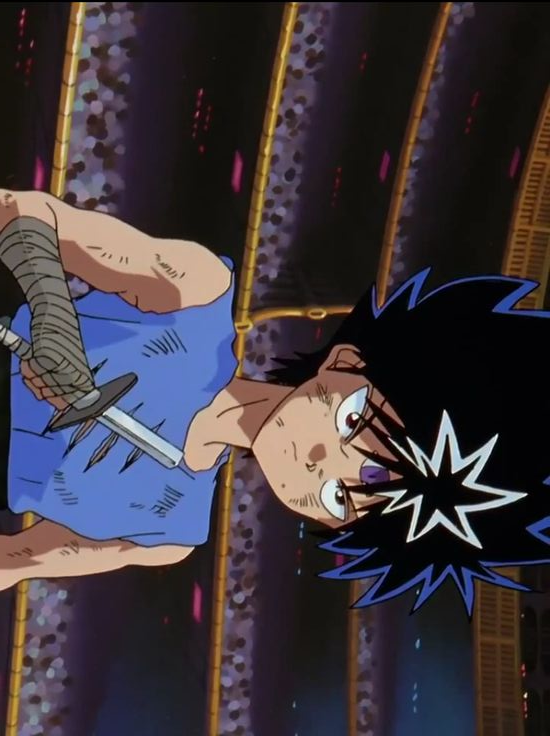

In [ ]:
imgr = cv2.rotate(img, cv2.cv2.ROTATE_90_CLOCKWISE)
cv2_imshow(imgr)